## Example based on script from Mask R-CNN documentation.
The source code of the example can be accessed on the link: [Mask R-CNN example for object detection with pre-trained neural network - ADICIONAR LINK](https://)

## Download the source code
Download the source code of the Mask R-CNN model.

In [1]:
!git clone https://github.com/tensorflow/tpu/

Cloning into 'tpu'...
remote: Enumerating objects: 10975, done.
remote: Counting objects: 100% (1177/1177), done.
remote: Compressing objects: 100% (605/605), done.
remote: Total 10975 (delta 659), reused 1008 (delta 547), pack-reused 9798
Receiving objects: 100% (10975/10975), 46.77 MiB | 27.28 MiB/s, done.
Resolving deltas: 100% (7697/7697), done.


## Import libraries

In [10]:
from IPython import display
from PIL import Image
import numpy as np
# %tensorflow_version 1.x #deprecated
import tensorflow as tf
from tensorflow import keras
import sys
sys.path.insert(0, 'tpu/models/official')
sys.path.insert(0, 'tpu/models/official/mask_rcnn')
import coco_metric
from mask_rcnn.object_detection import visualization_utils

# Versão do TensorFlow utilizada
print("Tensorflow version:", tf.__version__)

Tensorflow version: 2.9.2


## Load the COCO index mapping
This Colab uses a pretrained checkpoint of the Mask R-CNN model that is trained using the COCO dataset. Here is the mapping between the indices that the model predicts and the categories in text.

In [3]:
ID_MAPPING = {
    1: 'person',
    2: 'bicycle',
    3: 'car',
    4: 'motorcycle',
    5: 'airplane',
    6: 'bus',
    7: 'train',
    8: 'truck',
    9: 'boat',
    10: 'traffic light',
    11: 'fire hydrant',
    13: 'stop sign',
    14: 'parking meter',
    15: 'bench',
    16: 'bird',
    17: 'cat',
    18: 'dog',
    19: 'horse',
    20: 'sheep',
    21: 'cow',
    22: 'elephant',
    23: 'bear',
    24: 'zebra',
    25: 'giraffe',
    27: 'backpack',
    28: 'umbrella',
    31: 'handbag',
    32: 'tie',
    33: 'suitcase',
    34: 'frisbee',
    35: 'skis',
    36: 'snowboard',
    37: 'sports ball',
    38: 'kite',
    39: 'baseball bat',
    40: 'baseball glove',
    41: 'skateboard',
    42: 'surfboard',
    43: 'tennis racket',
    44: 'bottle',
    46: 'wine glass',
    47: 'cup',
    48: 'fork',
    49: 'knife',
    50: 'spoon',
    51: 'bowl',
    52: 'banana',
    53: 'apple',
    54: 'sandwich',
    55: 'orange',
    56: 'broccoli',
    57: 'carrot',
    58: 'hot dog',
    59: 'pizza',
    60: 'donut',
    61: 'cake',
    62: 'chair',
    63: 'couch',
    64: 'potted plant',
    65: 'bed',
    67: 'dining table',
    70: 'toilet',
    72: 'tv',
    73: 'laptop',
    74: 'mouse',
    75: 'remote',
    76: 'keyboard',
    77: 'cell phone',
    78: 'microwave',
    79: 'oven',
    80: 'toaster',
    81: 'sink',
    82: 'refrigerator',
    84: 'book',
    85: 'clock',
    86: 'vase',
    87: 'scissors',
    88: 'teddy bear',
    89: 'hair drier',
    90: 'toothbrush',
}
category_index = {k: {'id': k, 'name': ID_MAPPING[k]} for k in ID_MAPPING}

## Create a Tensorflow session
Now let us create a Tensorflow session to run the inference. You can either connect to a TPU or a normal CPU backend.

In [4]:
use_tpu = False #@param {type:"boolean"}
if use_tpu:
  import os
  import pprint

  assert 'COLAB_TPU_ADDR' in os.environ, 'ERROR: Not connected to a TPU runtime; please see the first cell in this notebook for instructions!'
  TPU_ADDRESS = 'grpc://' + os.environ['COLAB_TPU_ADDR']
  print('TPU address is', TPU_ADDRESS)

  session = tf.compat.v1.Session(TPU_ADDRESS, graph=tf.Graph())
  print('TPU devices:')
  pprint.pprint(session.list_devices())
else:
  session = tf.compat.v1.Session(graph=tf.Graph())

# Load the pretrained model
Loading the COCO pretrained saved model from the public GCS bucket. 

In [5]:
saved_model_dir = 'gs://cloud-tpu-checkpoints/mask-rcnn/1555659850' #@param {type:"string"}
model = tf.compat.v1.saved_model.loader.load(session, ['serve'], saved_model_dir)
#model = tf.keras.models.load_model()


Instructions for updating:
This function will only be available through the v1 compatibility library as tf.compat.v1.saved_model.loader.load or tf.compat.v1.saved_model.load. There will be a new function for importing SavedModels in Tensorflow 2.0.


# Load an image
Now, you can load an image. Use either the sample image included here, or update the field with an image of your choice.

In [6]:
# A single image from github
#!wget https://github.com/marcosleal/tcc_engEletronica/blob/main/img_colab/laranjeira_5_teste.zip?raw=true -O laranjeiras_teste.zip
#!unzip "/content/laranjeiras_teste.zip" -d "/content/laranjeiras"

# Entire dataset
!wget  https://github.com/MiniHulk1183/project_orange/raw/main/Imagens/Imagens_arvores_laranjas_v1.zip -O laranjeiras.zip
!unzip "/content/laranjeiras.zip" -d "/content/laranjeiras"

--2022-12-12 05:54:12--  https://github.com/MiniHulk1183/project_orange/raw/main/Imagens/Imagens_arvores_laranjas_v1.zip
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/MiniHulk1183/project_orange/main/Imagens/Imagens_arvores_laranjas_v1.zip [following]
--2022-12-12 05:54:12--  https://raw.githubusercontent.com/MiniHulk1183/project_orange/main/Imagens/Imagens_arvores_laranjas_v1.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15351147 (15M) [application/zip]
Saving to: ‘laranjeiras.zip’

laranjeiras.zip     100%[===================>]  14.64M  --.-KB/s    in 0.09s   

2022-12-12 05:54:13 

# Segmentation and predictions

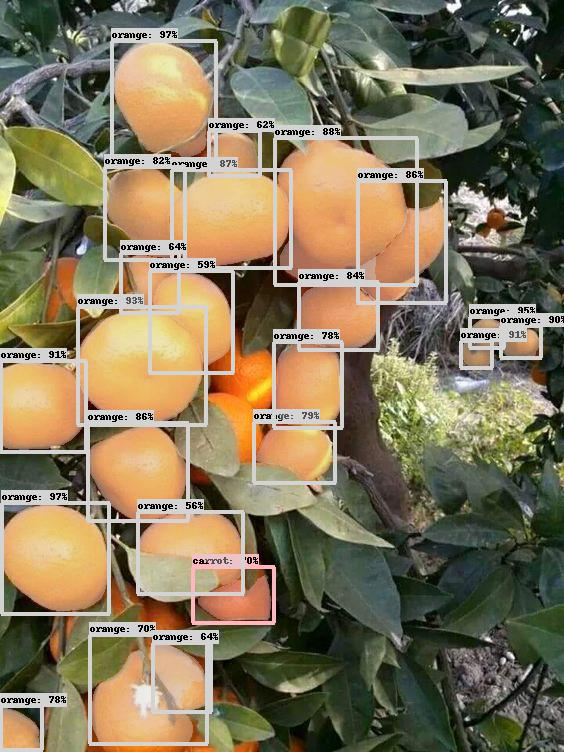

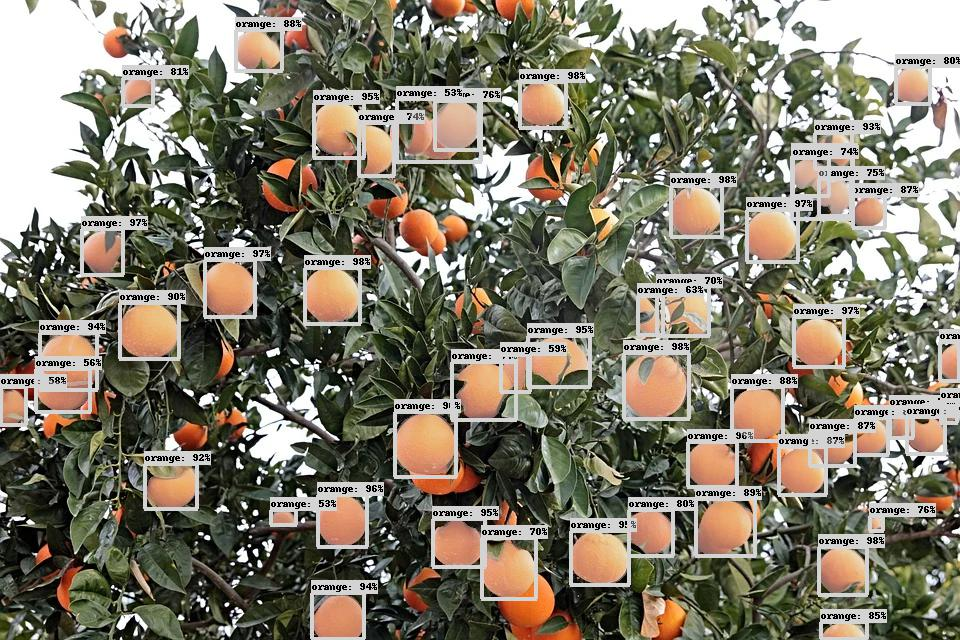

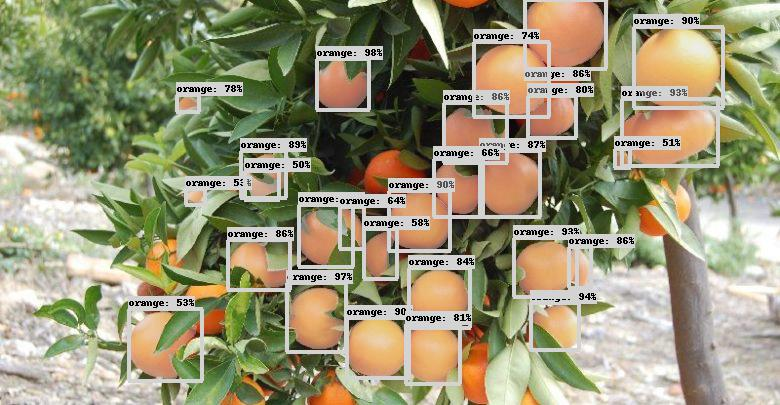

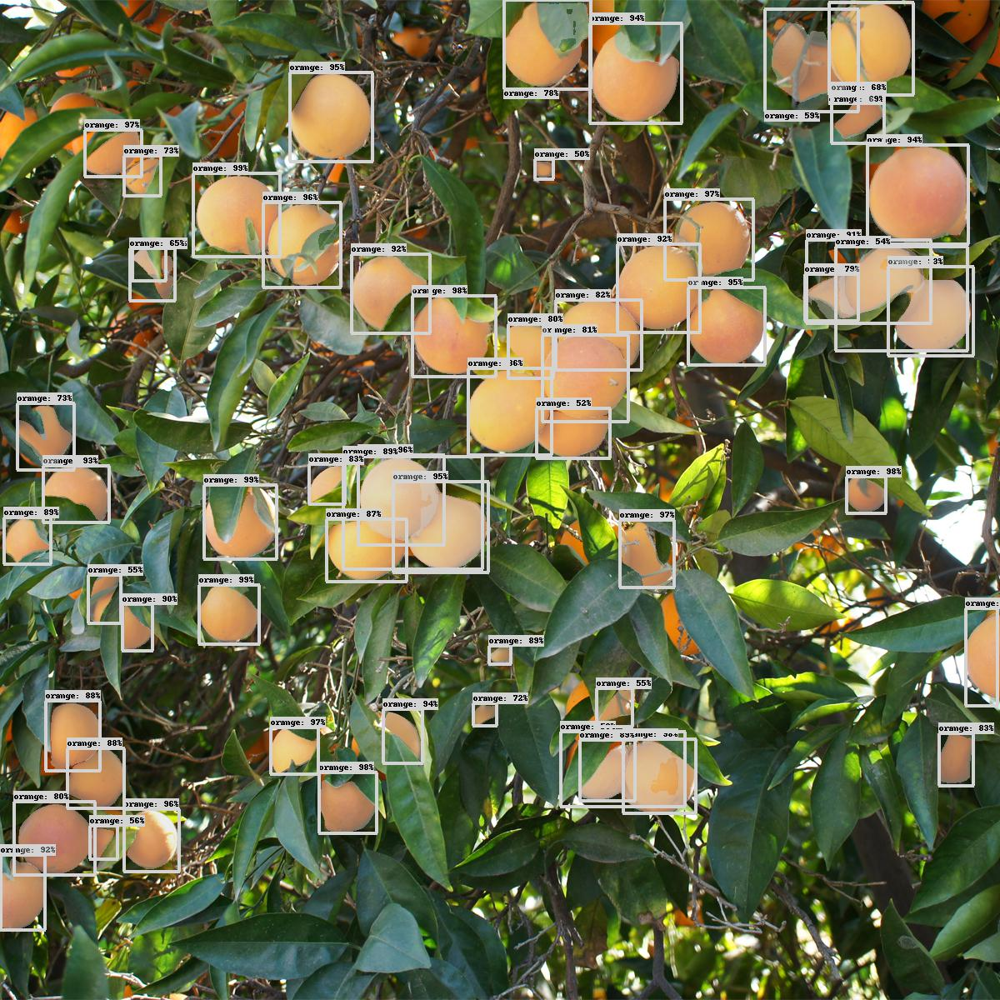

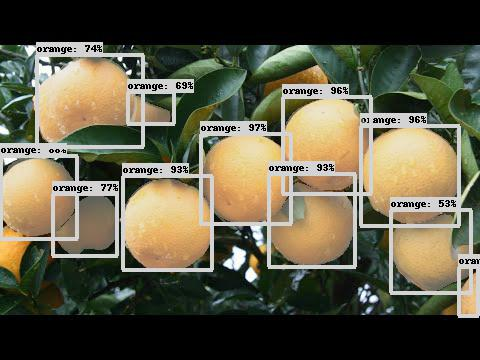

...

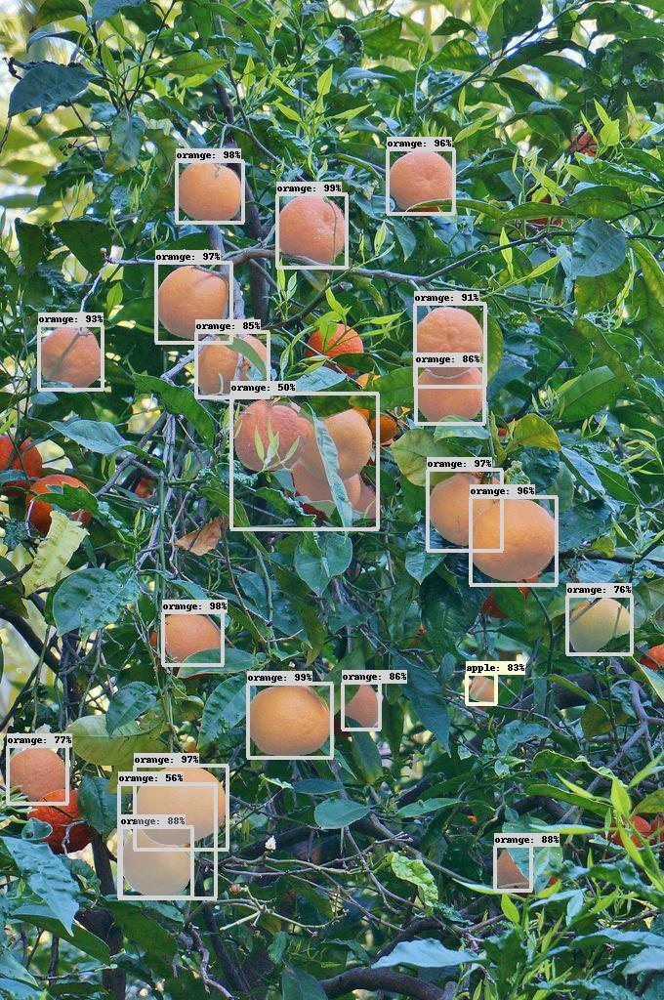

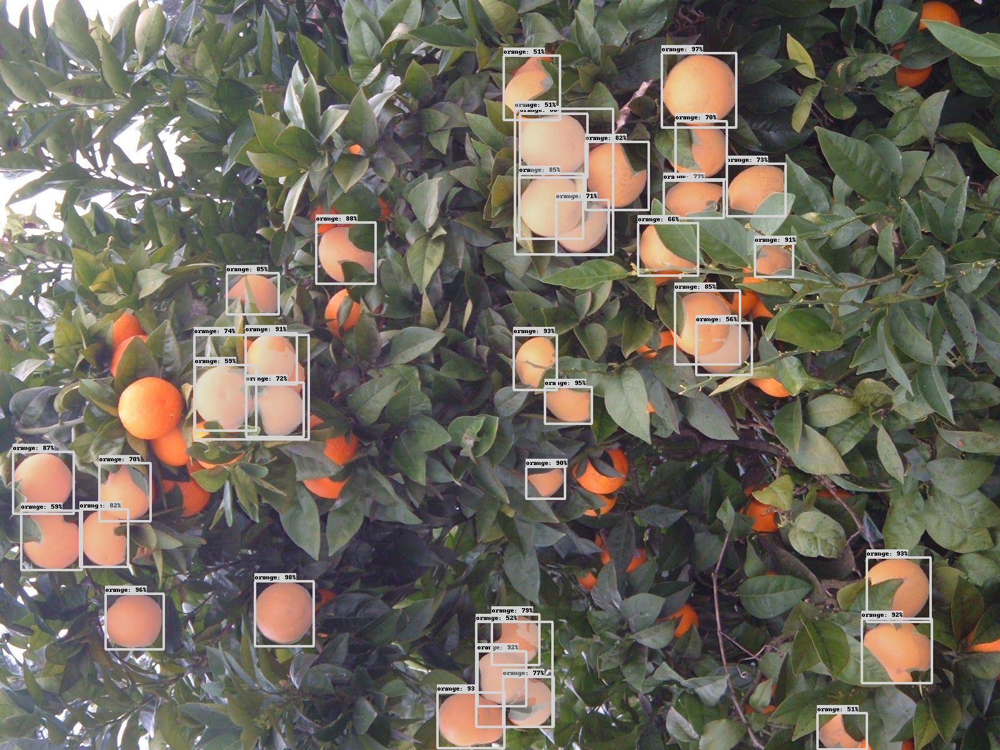

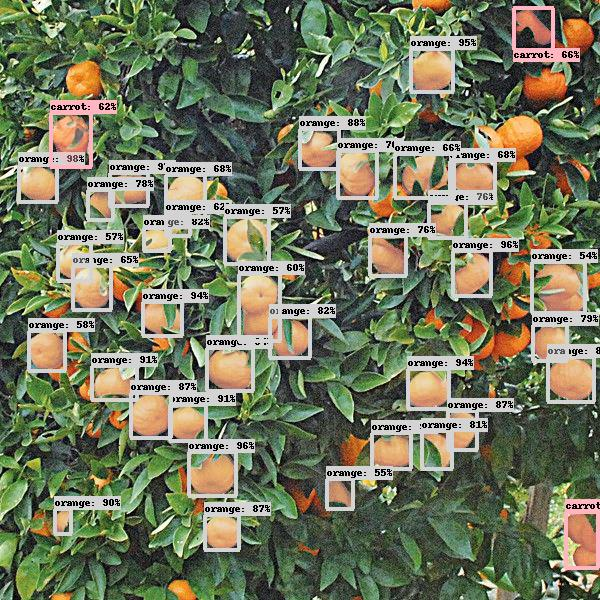

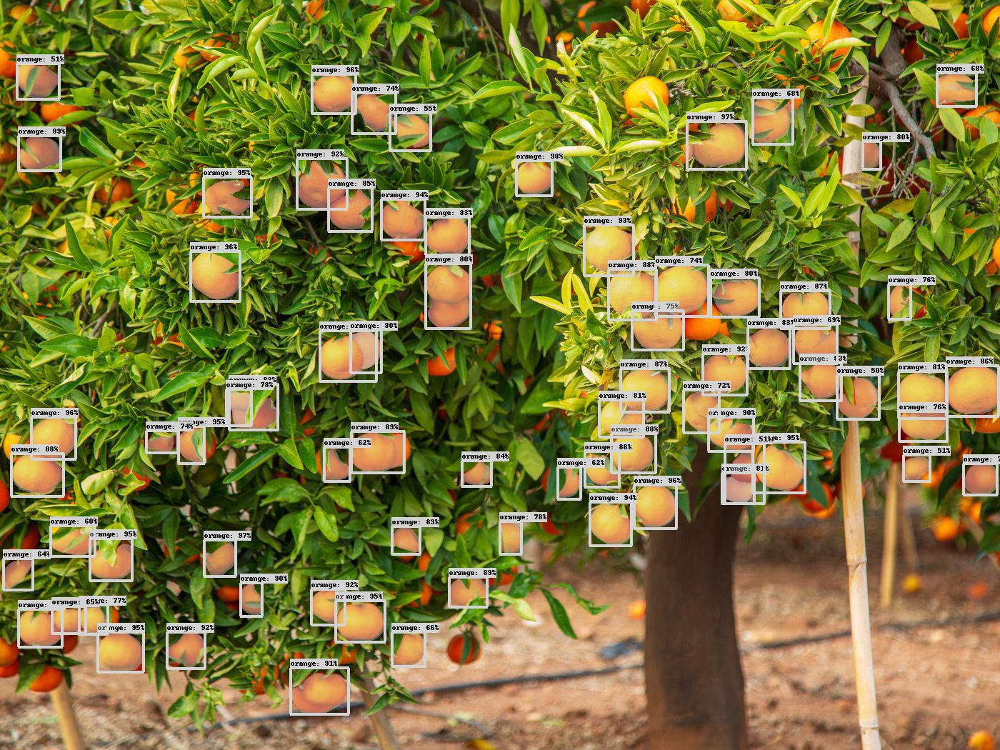

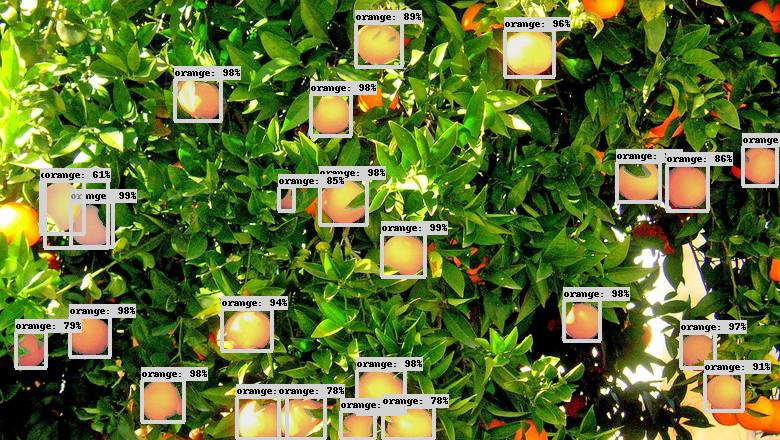

['/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_5.jpg', array(59, dtype=int32), 22, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_17.jpg', array(100, dtype=int32), 51, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_32.jpg', array(72, dtype=int32), 27, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_14.jpg', array(100, dtype=int32), 59, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_28.jpg', array(26, dtype=int32), 11, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_4.jpg', array(68, dtype=int32), 28, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_24.jpg', array(62, dtype=int32), 16, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_11.jpg', array(51, dtype=int32), 26, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_27.jpg', array(45, dtype=int32), 15, '/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_8.jpg', array(84, dtype=int32), 33, '/content/laranjeiras/Imagens_arvores_laranjas/lar

In [8]:
import os,glob

counter=0
folder = "/content/laranjeiras/Imagens_arvores_laranjas/*.jpg"  # para o dataset todo
#folder = "/content/laranjeiras/Imagens_arvores_laranjas/laranjeira_18.jpg" # apenas para uma imagem
resultados = []


for filename in glob.glob(folder):
  image_path = os.path.join(folder,filename)
  #print(image_path)
  resultados.append(image_path)
  with open(image_path, 'rb') as f:
    np_image_string = np.array([f.read()])
  image = Image.open(image_path)
  width, height = image.size
  np_image = np.array(image.getdata()).reshape(height, width, 3).astype(np.uint8)

  ##Perform instance segmentation and retrieve the predictions

  num_detections, detection_boxes, detection_classes, detection_scores, detection_masks, image_info = session.run(
    ['NumDetections:0', 'DetectionBoxes:0', 'DetectionClasses:0', 'DetectionScores:0', 'DetectionMasks:0', 'ImageInfo:0'],
    feed_dict={'Placeholder:0': np_image_string})
  num_detections = np.squeeze(num_detections.astype(np.int32), axis=(0,))
  detection_boxes = np.squeeze(detection_boxes * image_info[0, 2], axis=(0,))[0:num_detections]
  detection_scores = np.squeeze(detection_scores, axis=(0,))[0:num_detections]
  detection_classes = np.squeeze(detection_classes.astype(np.int32), axis=(0,))[0:num_detections]
  instance_masks = np.squeeze(detection_masks, axis=(0,))[0:num_detections]
  ymin, xmin, ymax, xmax = np.split(detection_boxes, 4, axis=-1)
  processed_boxes = np.concatenate([xmin, ymin, xmax - xmin, ymax - ymin], axis=-1)
  segmentations = coco_metric.generate_segmentation_from_masks(instance_masks, processed_boxes, height, width)

  ## detection
  max_boxes_to_draw = 200 
  min_score_thresh = 0.5    # limiar de detecção (50% = 0.5)
  image_with_detections = visualization_utils.visualize_boxes_and_labels_on_image_array(
    np_image,
    detection_boxes,
    detection_classes,
    detection_scores,
    category_index,
    instance_masks=segmentations,
    use_normalized_coordinates=False,
    max_boxes_to_draw=max_boxes_to_draw,
    min_score_thresh=min_score_thresh)
  output_image_path = 'test_results.jpg'
  Image.fromarray(image_with_detections.astype(np.uint8)).save(output_image_path)
  display.display(display.Image(output_image_path, width=1024))

  resultados.append(num_detections)

  num_laranjas=0
  for i,x in enumerate(detection_classes):
    if x == 55: # numero da classe da laranja 
      if detection_scores[i] >= 0.5:
        num_laranjas+=1
  resultados.append(num_laranjas)

## exporting results on ".csv" file
import pandas as pd
df = pd.DataFrame(np.reshape(resultados,(-1, 3)), columns=['Image_path', 'Instances', 'Oranges'])
print(resultados)

df.to_csv("dados_maskrcnn_laranjas.csv")